<a href="https://colab.research.google.com/github/ChristianConchari/Computer-Vision-Notes/blob/master/Tutorial_12_%20Morphological_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial 12: Morphological Image Processing

Morphological operators are used to manipulate the shape of images. They are often performed on binary images, similar to contour. It is possible to apply them in gray-scale and colour images but they are less effective. This tutorial will help you implement these operators in a practical case. 

<img src="https://media.giphy.com/media/26n6zAzxlfKsAT5N6/giphy.gif" width="200" height="200" align="center" />

### 1. Loading images, importing resources, and getting binary images

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


(630, 945)
uint8
(630, 945)
uint8


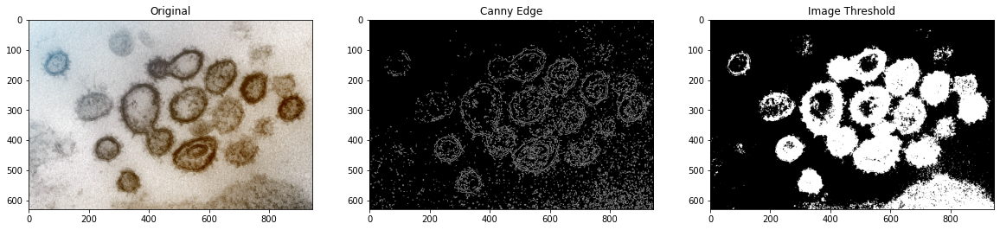

In [ ]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt
import os, requests
import numpy as np

# Download a microscope image depecting covid viruses from the Internet
img_data = requests.get("https://news.harvard.edu/wp-content/uploads/2020/03/Coronavirus-Image-1-945x630.jpg" , verify=False).content
with open('Coronavirus-Image-1-945x630.jpg', 'wb') as handler:
    handler.write(img_data)

# Load the image
image = cv2.imread('Coronavirus-Image-1-945x630.jpg')

# Convert the training image to gray Scale
grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Implement canny edge detection
canny = cv2.Canny(grayscale, 150, 200)

# Implement image threshold 
ret, thresh = cv2.threshold(grayscale,150,200,cv2.THRESH_BINARY_INV)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))

ax1.set_title('Original')
ax1.imshow(image, cmap='gray')

ax2.set_title('Canny Edge')
ax2.imshow(canny, cmap='gray')

ax3.set_title('Image Threshold')
ax3.imshow(thresh, cmap='gray')

print(canny.shape)
print(canny.dtype)

print(thresh.shape)
print(thresh.dtype)

### 2. Translation

#### **Method 1: OpenCV**
There are two principal ways when it's about image translation. The first one requires to define a translation matrix named M: 

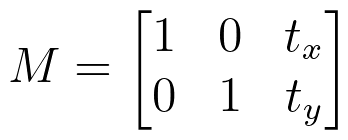



Where $t_{x}$ states the number of pixels that the image will translate horizontally and $t_{y}$ for vertical pixels. Both values can have negative and positives values, where negatives mean a translation to left and up respectivelly. 


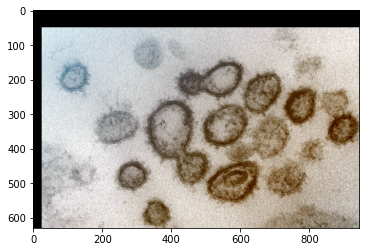

In [ ]:
copy = np.copy(image)

# Define the matrix
M = np.float32([[1, 0, 25], 
                [0, 1, 50]])

# Shift the image 25 pixels to the right and 50 pixels down
# The last parameter is the size of the image
translated = cv2.warpAffine(copy, M, (copy.shape[1], copy.shape[0]))
plt.imshow(translated, cmap="gray")

**Method 2: Imutils**

On the other hand, translation is also provided in third-party libraries. Currently, the library `Imutils` is one of the most used and provides with a series of convenience functions to make basic image processing operations such as translation, rotation, resizing, skeletonization. 

In the case of translation, you can simply make a call to the translate function of imutils instead of manually constructing the translation matrix M and calling cv2.warpAffine,

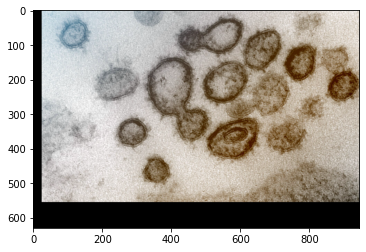

In [ ]:
import imutils

# Translate the image x=25 pixels to the right and y=75 pixels up
translated = imutils.translate(copy, 25, -75)
plt.imshow(translated, cmap="gray")

### 3. Scaling

**Method 1: OpenCV**

Scaling comes in handy in many image processing as well as machine learning applications. For example, it can reduce the time of training of a neural network. 

When implementing OpenCV, it's good to consider the components of the following matrix: 
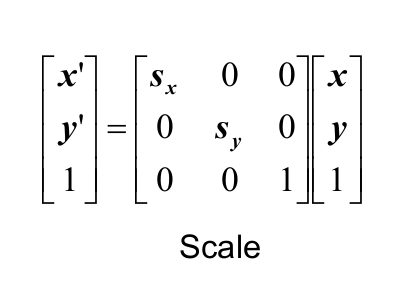

Where $S_{x}$ and $S_{y}$ are the scaling factors for x-axis and y-axis, respectively.


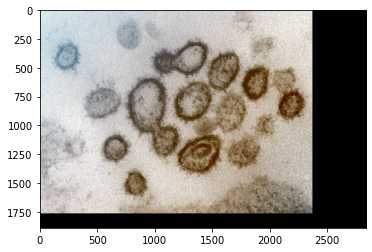

In [ ]:
copy2 = np.copy(image)

# Get the image shape
rows, cols, dim = copy2.shape

# Transformation matrix for Scaling
M = np.float32([[2.5, 0  , 0],
            	[0,   2.8, 0],
            	[0,   0,   1]])

# Apply a perspective transformation to the image
scaled_img = cv2.warpPerspective(copy2,M,(cols*3,rows*3))

# Show the resulting image
plt.imshow(scaled_img)
plt.show(cv2.resize)

**Method 2: OpenCV**

OpenCV also provides with the `cv2.resizecv2.resize()` method which can resize an image in multiple modes. For the following examples, half is taken by considering a scale factor for the x and y axis. Bigger is resized considering the target number of pixels. Finally Stretch_near is resized also considering an interpolation parameter, which states how the new pixels should be formed. 

Read the docs for more info about interpolation: https://docs.opencv.org/3.4/da/d54/group__imgproc__transform.html 

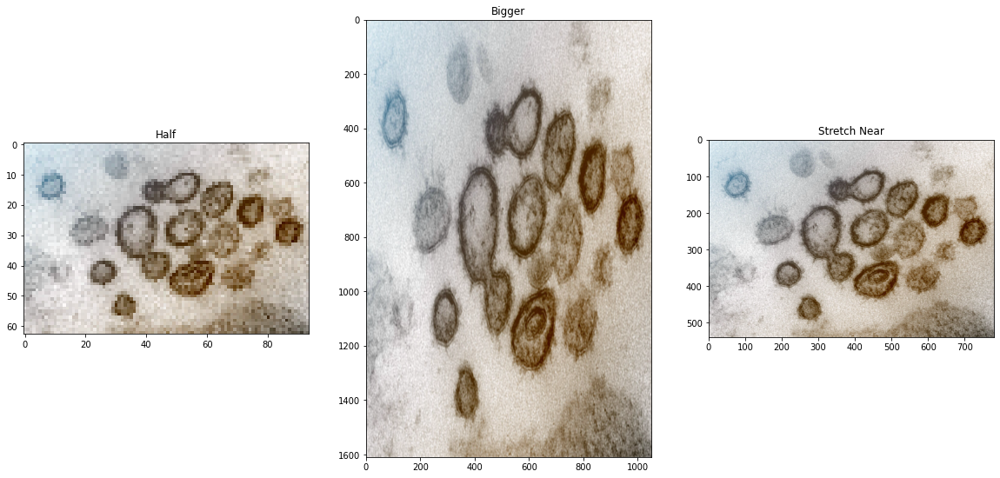

In [ ]:
half = cv2.resize(copy2, (0, 0), fx = 0.1, fy = 0.1)
bigger = cv2.resize(copy2, (1050, 1610))
 
stretch_near = cv2.resize(copy2, (780, 540),
               interpolation = cv2.INTER_NEAREST)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))

ax1.set_title('Half')
ax1.imshow(half, cmap='gray')

ax2.set_title('Bigger')
ax2.imshow(bigger, cmap='gray')

ax3.set_title('Stretch Near')
ax3.imshow(stretch_near, cmap='gray')

**Method 3: Imutils**

Finally, the resize function of `imutils` maintains the aspect ratio and provides the keyword arguments width and height so the image can be resized to the intended width/height while (1) maintaining aspect ratio and (2) ensuring the dimensions of the image do not have to be explicitly computed by the developer.

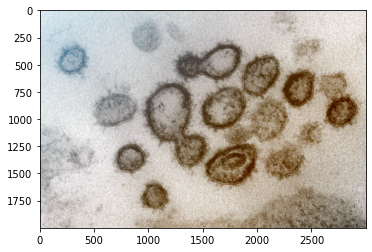

In [ ]:
# resize the image and display it
resized = imutils.resize(copy2, width=3000)
plt.imshow(resized)

### 4. Reflection 

**Method 1: OpenCV**

Image reflection (or mirroring) is useful for flipping an image, it can flip the image vertically and horizontally. For reflection along the x-axis, we set the value of $S_{y}$ to -1, and $S_{x}$ to 1 and vice-versa for the y-axis reflection. Notice how we insert cols and rows values when needed.

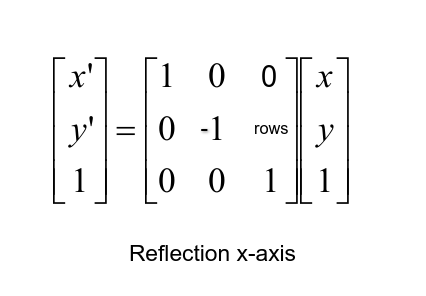

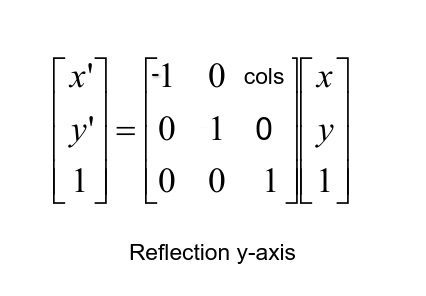



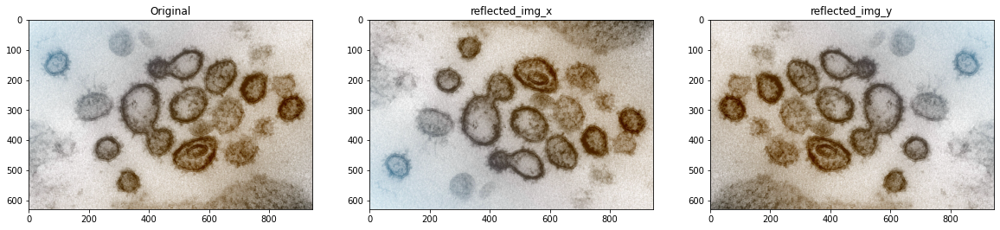

In [ ]:
copy3 = np.copy(image)

# get the image shape
rows, cols, dim = copy3.shape
# transformation matrix for x-axis reflection 
M_x = np.float32([[1,  0, 0   ],
                [0, -1, rows],
                [0,  0, 1   ]])
# transformation matrix for y-axis reflection
M_y = np.float32([[-1, 0, cols],
                [ 0, 1, 0   ],
                [ 0, 0, 1   ]])
# apply a perspective transformation to the image for x-axis
reflected_img_x = cv2.warpPerspective(copy3,M_x,(int(cols),int(rows)))

# apply a perspective transformation to the image for x-axis
reflected_img_y = cv2.warpPerspective(copy3,M_y,(int(cols),int(rows)))

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))

ax1.set_title('Original')
ax1.imshow(copy3, cmap='gray')

ax2.set_title('reflected_img_x')
ax2.imshow(reflected_img_x, cmap='gray')

ax3.set_title('reflected_img_y')
ax3.imshow(reflected_img_y, cmap='gray')

### 5. Dilation
Dilation enlarges bright, white areas in an image by adding pixels to the perceived boundaries of objects in that image.

To dilate an image in OpenCV, you can use the `dilate` function and three inputs: 
- an original binary image
- a kernel that determines the size of the dilation (None will result in a default size)
- a number of iterations to perform the dilation (typically = 1). 

In the below example, we have a 5x5 kernel of ones, which move over an image, like a filter, and turn a pixel white if any of its surrounding pixels are white in a 5x5 window! We’ll use a simple image of the cursive letter “j” as an example.

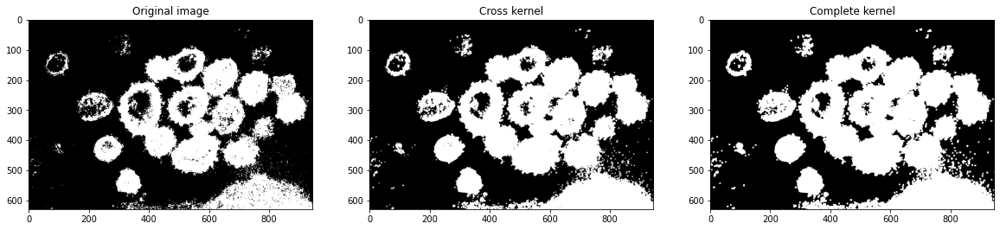

In [ ]:
# Reads in a binary image
copy3 = np.copy(thresh)

# Create a 5x5 kernel s 
s_1 = np.uint8([[0, 0, 1, 0, 0],
                    [0, 0, 1, 0, 0],
                    [1, 1, 1, 1, 1],
                    [0, 0, 1, 0, 0], 
                   [0, 0, 1, 0, 0], 
                    ])

s_2 = np.ones((5,5),np.uint8)

# Dilate the image
dilation = cv2.dilate(copy3, s_1, iterations = 1)

# Dilate the image
dilation2 = cv2.dilate(copy3, s_2, iterations = 1)


f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20,10))

ax0.set_title('Original image')
ax0.imshow(copy3, cmap='gray')

ax1.set_title('Cross kernel')
ax1.imshow(dilation, cmap='gray')

ax2.set_title('Complete kernel')
ax2.imshow(dilation2, cmap='gray')

### 6. Erosion
Erosion does the opposite: it removes pixels along object boundaries and shrinks the size of objects.


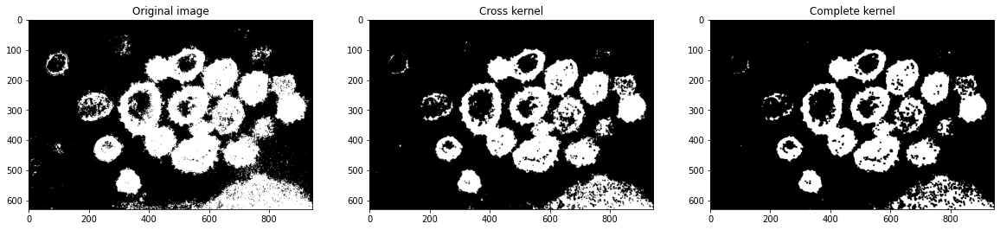

In [ ]:
# Reads in a binary image
copy4 = np.copy(thresh)

# Erode the image
erode = cv2.erode(copy4, s_1, iterations = 1)

# Erode the image
erode2 = cv2.erode(copy4, s_2, iterations = 1)

# Display the results
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20,10))
ax0.set_title('Original image')
ax0.imshow(copy4, cmap='gray')

ax1.set_title('Cross kernel')
ax1.imshow(erode, cmap='gray')

ax2.set_title('Complete kernel')
ax2.imshow(erode2, cmap='gray')

### 7. Opening & Closing

As mentioned in the lecture video, the last two operations are often combined for desired results. One such combination is called **opening**, which is erosion followed by dilation. This is useful in noise reduction in which erosion first gets rid of noise (and shrinks the object) then dilation enlarges the object again, but the noise will have disappeared from the previous erosion!

To implement this in OpenCV, we use the function `morphologyEx` with the image, the operation we want to perform, and our kernel passed in.

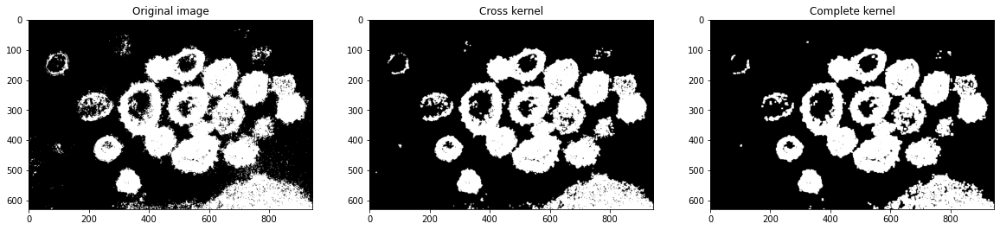

In [ ]:
# Reads in a binary image
copy5 = np.copy(thresh)

# Opening the image
opening = cv2.morphologyEx(copy5, cv2.MORPH_OPEN, s_1)

# Opening the image
opening2 = cv2.morphologyEx(copy5, cv2.MORPH_OPEN, s_2)

# Display the results
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20,10))
ax0.set_title('Original image')
ax0.imshow(copy5, cmap='gray')

ax1.set_title('Cross kernel')
ax1.imshow(opening, cmap='gray')

ax2.set_title('Complete kernel')
ax2.imshow(opening2, cmap='gray')

**Closing** is the reverse combination of opening; it’s dilation followed by erosion, which is useful in closing small holes or dark areas within an object.

Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.



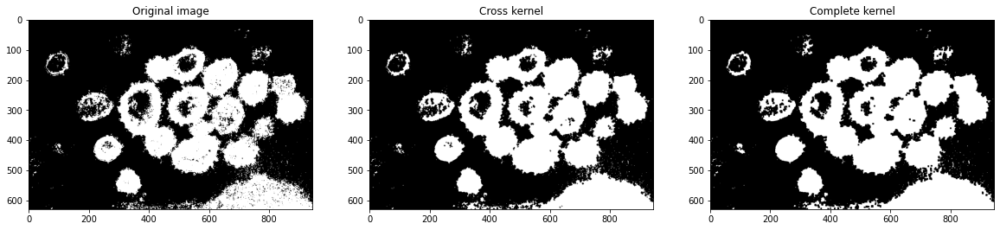

In [ ]:
# Reads in a binary image
copy6 = np.copy(thresh)

# Opening the image
closing = cv2.morphologyEx(copy6, cv2.MORPH_CLOSE, s_1)

# Opening the image
closing2 = cv2.morphologyEx(copy6, cv2.MORPH_CLOSE, s_2)

# Display the results
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20,10))
ax0.set_title('Original image')
ax0.imshow(copy6, cmap='gray')

ax1.set_title('Cross kernel')
ax1.imshow(closing, cmap='gray')

ax2.set_title('Complete kernel')
ax2.imshow(closing2, cmap='gray')

### 8. Boundary Extraction
It is the difference between dilation and erosion of an image. The result will look like the outline of the object.

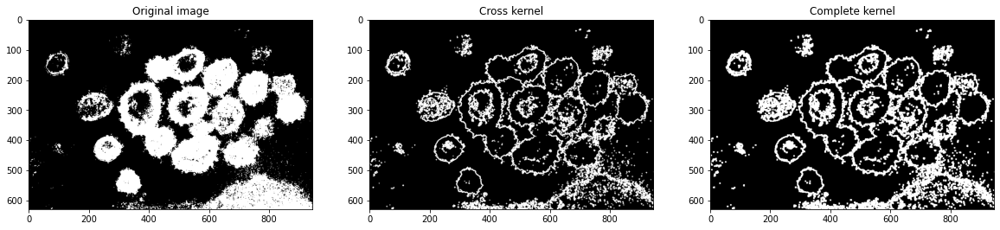

In [ ]:
# Reads in a binary image
copy7 = np.copy(thresh)

# Opening the image
gradient = cv2.morphologyEx(copy7, cv2.MORPH_GRADIENT, s_1) 

# Opening the image
gradient2 = cv2.morphologyEx(copy7, cv2.MORPH_GRADIENT, s_2) 

# Display the results
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(20,10))
ax0.set_title('Original image')
ax0.imshow(copy7, cmap='gray')

ax1.set_title('Cross kernel')
ax1.imshow(gradient, cmap='gray')

ax2.set_title('Complete kernel')
ax2.imshow(gradient2, cmap='gray')

# Exercise 1: Water Pollution
Water is usually formed by small pollution particles and some bacteria. However, the presence of big quantities of certain types of bacteria should turn on the alarms. For example, the presence of coliform bacteria, specifically **E. coli**, in drinking water suggests that it may contain pathogens that can cause diarrhoea, vomiting, cramps, nausea, headaches, fever, or fatigue.

Given that to classify and detect dangerous bacteria and harmful particles usually need a specialist and proper analysis equipment, this type of fieldwork has become expensive and sometimes unavailable in remote areas. Therefore, you will need to implement a way to automatically count and classify if a water microscope picture is drinkable or not. 

The exercise's main purpose is to implement morphological image processing so you'll have to use at least four of the methods previously explained in the pre-processing step. On the other hand, you can use the counting and detection method of your selection (e.g. Generalised Hough Transform or ORB). For this exercise, you can use the following image: https://drive.google.com/file/d/1f5wnYfWC3Gag2Y7yx8yRUdprxONE-H5c/view?usp=sharing), which contains a microscope sample with ecoli bacteria. Also, when it's about finding image datasets, *Google Dataset Search* (https://datasetsearch.research.google.com/) is one of the most useful tools, so you can search for microscope image datasets with **E. coli** bacteria and implement the tutorial with those images. 

## 1. SOLUTION


### 1.1 Morphological image processing

In this first part, we´ll implement morphological operations to increase the image quality for posterior processing steps.

We begin our analysis by converting the image to gray scale, in order to process it later with morphological operations.

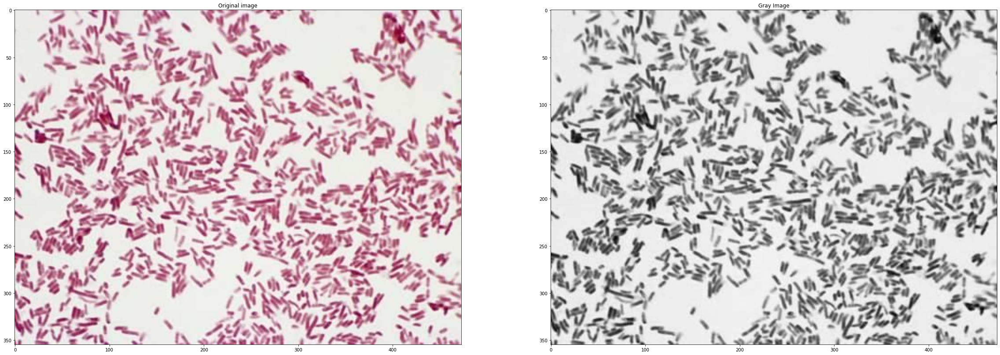

In [ ]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt
import os, requests
import numpy as np
import imutils


# Load the image
image = cv2.imread('ecoli bacteria in water.jpeg')
# Convert the image to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# Convert the training image to gray Scale
grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,20))

ax1.set_title('Original image')
ax1.imshow(image)

ax2.set_title('Gray Image')
ax2.imshow(grayscale, cmap='gray')

As we can see, there are small parts that we could reduce by erosion and dilation, as in this case the parts that interest us are black, we will work on erosion as dilation and dilation as erosion, being that similar results will be obtained.

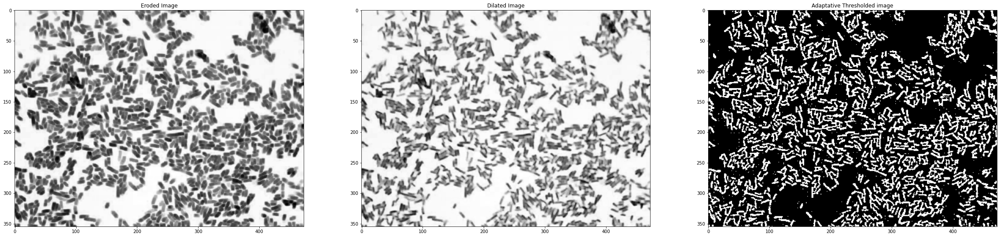

In [ ]:
# Create a 4x4 kernel for morphological process
s = np.ones((2,2),np.uint8)
# Erode the image (1st Morphological process)
erode = cv2.erode(grayscale, s, iterations = 2)
# Dilate the image (2nd Morphological process)
dilation = cv2.dilate(erode, s, iterations = 2)
# Apply adaptative threshold
output_adapthresh = cv2.adaptiveThreshold (dilation, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 5, 4)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(40,20))

ax1.set_title('Eroded Image')
ax1.imshow(erode, cmap='gray')

ax2.set_title('Dilated Image')
ax2.imshow(dilation, cmap='gray')

ax3.set_title('Adaptative Thresholded image')
ax3.imshow(output_adapthresh, cmap='gray')

As we can see in the last image, there are still a few small textures around the contours, to eliminate them, we will apply opening. And finally to eliminate the small remaining pieces that are not near sectors of interest, or that signify noise, we will do a final erosion.

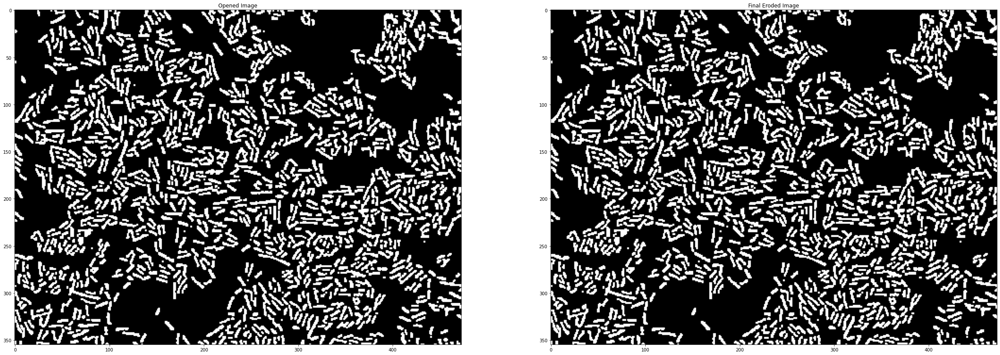

In [ ]:
# Define the kernel for the first morphological operation
s1 = np.ones((2,2),np.uint8)
# Apply opening (3rd morphological operation)
output_opening = cv2.morphologyEx(output_adapthresh, cv2.MORPH_OPEN, s1)
# Define the kernel for the second morphological operation
s2 = np.ones((1,1),np.uint8)
# Apply erosion (4th morphological operation)
output_erosion = cv2.erode(output_opening, s2, iterations = 2)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,20))

ax1.set_title('Opened Image')
ax1.imshow(output_opening, cmap='gray')
ax2.set_title('Final Eroded Image')
ax2.imshow(output_erosion, cmap='gray')

As we can see the results are quite good, so, to work with the same procedure in several images we will create the following function.

In [ ]:
def process_image(imgname):
  # Read the image
  input = cv2.imread(imgname)
  # Convert the image to gray
  input_gray = cv2.cvtColor(input, cv2.COLOR_BGR2GRAY)
  # Create a 4x4 kernel for morphological process
  s = np.ones((2,2),np.uint8)
  # Erode the image (1st Morphological process)
  erode = cv2.erode(input_gray, s, iterations = 2)
  # Dilate the image (2nd Morphological process)
  dilation = cv2.dilate(erode, s, iterations = 2)
  # Apply adaptative threshold
  output_adapthresh = cv2.adaptiveThreshold (dilation, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 5, 4)
  # Define the kernel for the first morphological operation
  s1 = np.ones((2,2),np.uint8)
  # Apply opening (3rd morphological operation)
  output_opening = cv2.morphologyEx(output_adapthresh, cv2.MORPH_OPEN, s1)
  # Define the kernel for the second morphological operation
  s2 = np.ones((1,1),np.uint8)
  # Apply erosion (4th morphological operation)
  output_erosion = cv2.erode(output_opening, s2, iterations = 2)

  return output_erosion

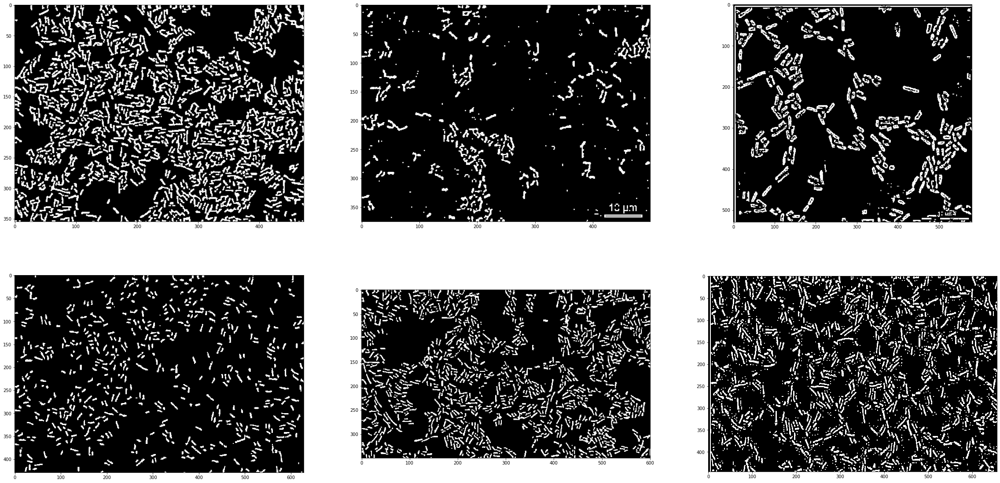

In [ ]:
ecoli1 = process_image('ecoli bacteria in water.jpeg')
ecoli2 = process_image('ecoli2.jpeg')
ecoli3 = process_image('ecoli3.jpeg')
ecoli4 = process_image('ecoli4.jpeg')
ecoli5 = process_image('ecoli5.jpeg')
ecoli6 = process_image('ecoli6.jpeg')


f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(40,20))

ax1.imshow(ecoli1, cmap='gray')
ax2.imshow(ecoli2, cmap='gray')
ax3.imshow(ecoli3, cmap='gray')
ax4.imshow(ecoli4, cmap='gray')
ax5.imshow(ecoli5, cmap='gray')
ax6.imshow(ecoli6, cmap='gray')

In the six worked images we can see that in most of the cases, we obtain pretty good results. Therefore, we can apply our final step in order to detect or count the number of E-coli parasites inside the image.

### 1.2 Contours detecting

For detecting the contours inside the image we will use the findContours() OpenCV function.

In [ ]:
def find_contours(input,image):
  input_gray = cv2.cvtColor(input, cv2.COLOR_BGR2GRAY)
  contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL,  cv2.CHAIN_APPROX_SIMPLE)
  output_contour = cv2.cvtColor(input_gray, cv2.COLOR_GRAY2BGR)
  cv2.drawContours(input, contours, -1, (0, 0, 255), 1)
  return input, len(contours)

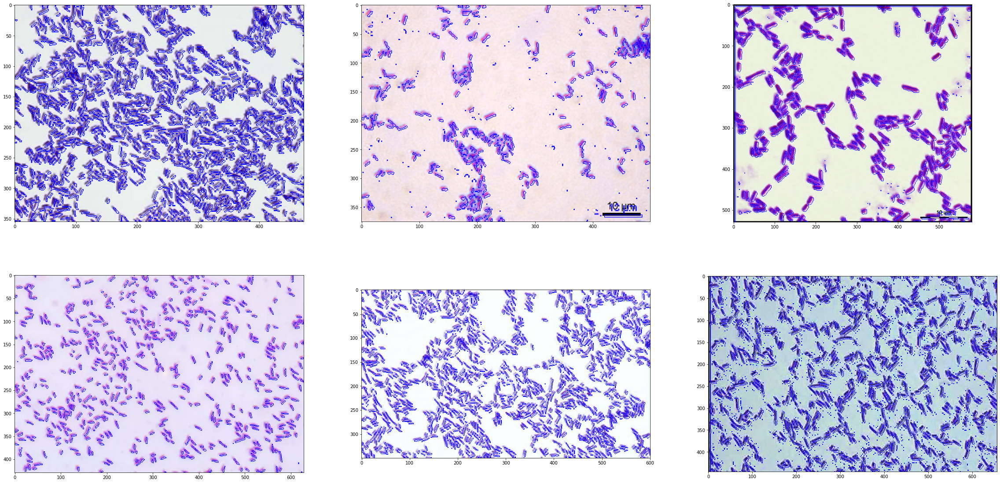

In [ ]:
f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(40,20))

input1, contour_ecoli1 = find_contours(cv2.imread('ecoli bacteria in water.jpeg'), ecoli1)
input2, contour_ecoli2 = find_contours(cv2.imread('ecoli2.jpeg'), ecoli2)
input3, contour_ecoli3 = find_contours(cv2.imread('ecoli3.jpeg'), ecoli3)
input4, contour_ecoli4 = find_contours(cv2.imread('ecoli4.jpeg'), ecoli4)
input5, contour_ecoli5 = find_contours(cv2.imread('ecoli5.jpeg'), ecoli5)
input6, contour_ecoli6 = find_contours(cv2.imread('ecoli6.jpeg'), ecoli6)

ax1.imshow(input1, cmap='gray')
ax2.imshow(input2, cmap='gray')
ax3.imshow(input3, cmap='gray')
ax4.imshow(input4, cmap='gray')
ax5.imshow(input5, cmap='gray')
ax6.imshow(input6, cmap='gray')

In [ ]:
print(f'- {contour_ecoli1} parasites were detected in image 1')
print(f'- {contour_ecoli2} parasites were detected in image 2')
print(f'- {contour_ecoli3} parasites were detected in image 3')
print(f'- {contour_ecoli4} parasites were detected in image 4')
print(f'- {contour_ecoli5} parasites were detected in image 5')
print(f'- {contour_ecoli6} parasites were detected in image 6')

- 806 parasites were detected in image 1
- 352 parasites were detected in image 2
- 414 parasites were detected in image 3
- 577 parasites were detected in image 4
- 1169 parasites were detected in image 5
- 2002 parasites were detected in image 6


With the latest results, we can conclude that the number of E-coli parasites in each image were counted very approximately.

### 1.3 ORB application

We will try to apply ORB to find coincidences between the parasites corresponding to each image, using the previously detected contours.

In [ ]:
# Create the ORB object parameters
orb = cv2.ORB_create(nfeatures=100000,scaleFactor = 2.5, edgeThreshold = 20, nlevels = 8) 
# Set a low accuracy percentage
accuracy_percentage = 0.85 

# Find the keypoints and descriptors for the image of the student 1
keypoints_train, descriptors_train = orb.detectAndCompute(ecoli1, None)

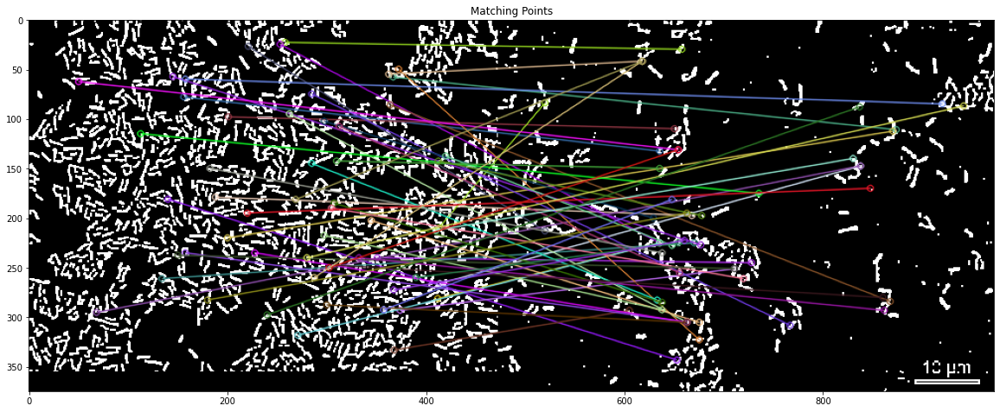

- 55 matches found


In [ ]:
keypoints_1, descriptors_1 = orb.detectAndCompute(ecoli2, None)

bf2 = cv2.BFMatcher()
matches = bf2.knnMatch(descriptors_train,descriptors_1,k=2)

good = []
for m,n in matches:
    if m.distance < accuracy_percentage*n.distance:
        good.append([m])

result = cv2.drawMatchesKnn(ecoli1, keypoints_train, ecoli2, keypoints_1, good, None, flags = 2)
# Set the default figure size
plt.rcParams['figure.figsize'] = [20,10]

# Display the best matching points
plt.title('Matching Points')
plt.imshow(result)
plt.show()

print(f'- {len(good)} matches found' )

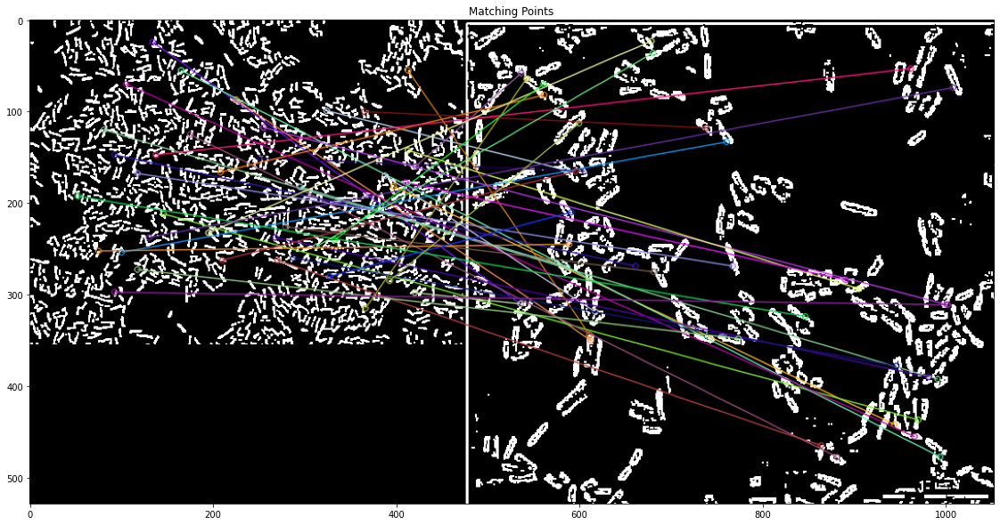

- 40 matches found


In [ ]:
keypoints_2, descriptors_2 = orb.detectAndCompute(ecoli3, None)

bf2 = cv2.BFMatcher()
matches = bf2.knnMatch(descriptors_train,descriptors_2,k=2)

good = []
for m,n in matches:
    if m.distance < accuracy_percentage*n.distance:
        good.append([m])


result = cv2.drawMatchesKnn(ecoli1, keypoints_train, ecoli3, keypoints_2, good, None, flags = 2)
# Set the default figure size
plt.rcParams['figure.figsize'] = [20,10]

# Display the best matching points
plt.title('Matching Points')
plt.imshow(result)
plt.show()

print(f'- {len(good)} matches found' )

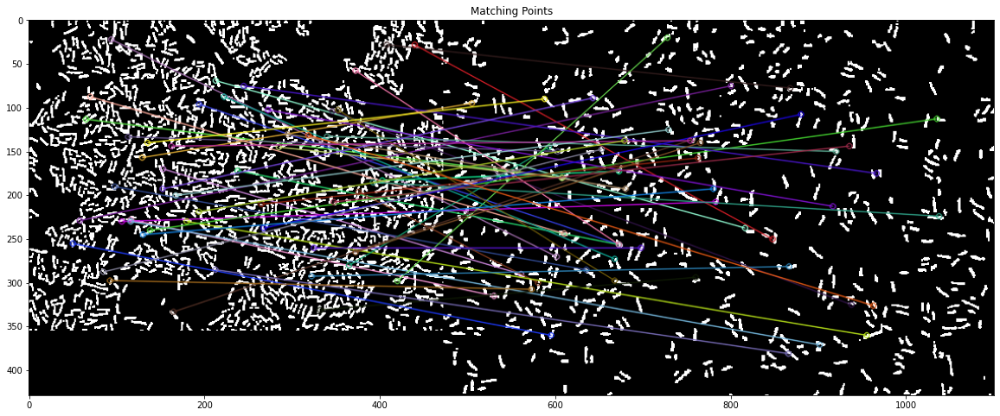

- 51 matches found


In [ ]:
keypoints_3, descriptors_3 = orb.detectAndCompute(ecoli4, None)

bf2 = cv2.BFMatcher()
matches = bf2.knnMatch(descriptors_train,descriptors_3,k=2)

good = []
for m,n in matches:
    if m.distance < accuracy_percentage*n.distance:
        good.append([m])


result = cv2.drawMatchesKnn(ecoli1, keypoints_train, ecoli4, keypoints_3, good, None, flags = 2)
# Set the default figure size
plt.rcParams['figure.figsize'] = [20,10]

# Display the best matching points
plt.title('Matching Points')
plt.imshow(result)
plt.show()

print(f'- {len(good)} matches found' )

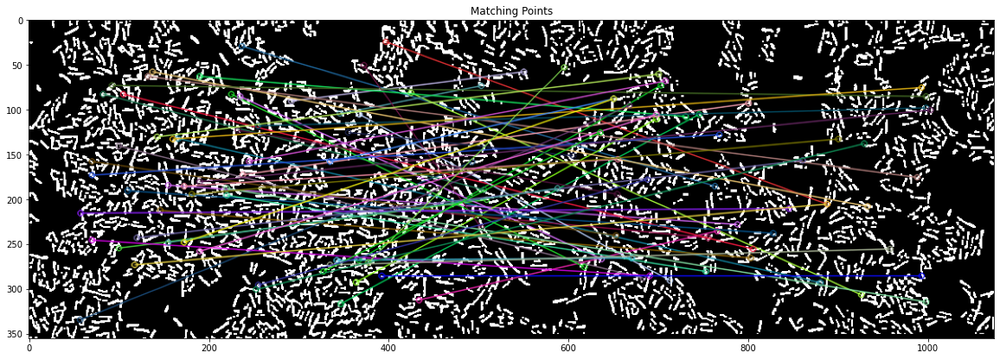

- 57 matches found


In [ ]:
keypoints_4, descriptors_4 = orb.detectAndCompute(ecoli5, None)

bf2 = cv2.BFMatcher()
matches = bf2.knnMatch(descriptors_train,descriptors_4,k=2)

good = []
for m,n in matches:
    if m.distance < accuracy_percentage*n.distance:
        good.append([m])


result = cv2.drawMatchesKnn(ecoli1, keypoints_train, ecoli5, keypoints_4, good, None, flags = 2)
# Set the default figure size
plt.rcParams['figure.figsize'] = [20,10]

# Display the best matching points
plt.title('Matching Points')
plt.imshow(result)
plt.show()

print(f'- {len(good)} matches found' )

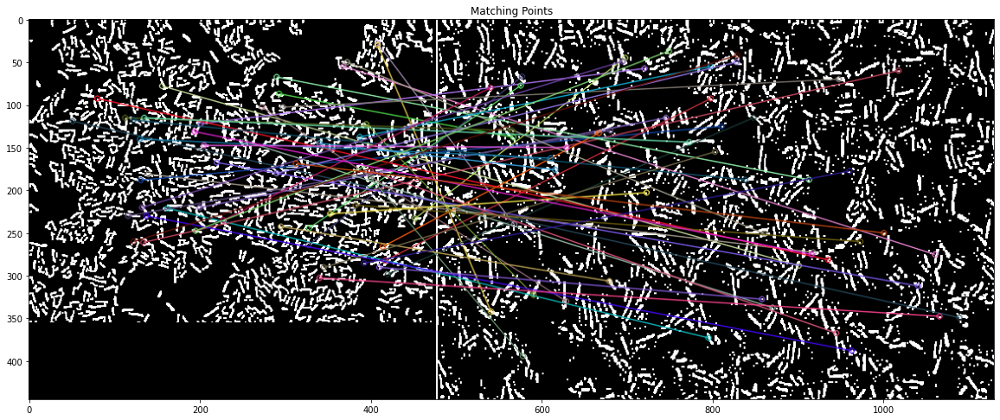

- 51 matches found


In [ ]:
keypoints_5, descriptors_5 = orb.detectAndCompute(ecoli6, None)

bf2 = cv2.BFMatcher()
matches = bf2.knnMatch(descriptors_train,descriptors_5,k=2)

good = []
for m,n in matches:
    if m.distance < accuracy_percentage*n.distance:
        good.append([m])


result = cv2.drawMatchesKnn(ecoli1, keypoints_train, ecoli6, keypoints_5, good, None, flags = 2)
# Set the default figure size
plt.rcParams['figure.figsize'] = [20,10]

# Display the best matching points
plt.title('Matching Points')
plt.imshow(result)
plt.show()

print(f'- {len(good)} matches found' )

Based on the experience acquired during this tutorial, we were able to show that the use of ORB (Oriented FAST and rotated BRIEF) is not recommended for this type of application due to the difficulty of matching the key points of each image. On the other hand, it was observed that the results obtained with the use of the Find Contours function are much closer to the real value of bacteria in each image.
